<a href="https://colab.research.google.com/github/Sara-Samer/head-pose-estimation/blob/main/Head%20Pose%20Estimation%20Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import dlib
import numpy as np
from imutils import face_utils

face_landmark_path = 'shape_predictor_68_face_landmarks.dat'

K = [6.5308391993466671e+002, 0.0, 3.1950000000000000e+002,
     0.0, 6.5308391993466671e+002, 2.3950000000000000e+002,
     0.0, 0.0, 1.0]
D = [7.0834633684407095e-002, 6.9140193737175351e-002, 0.0, 0.0, -1.3073460323689292e+000]

cam_matrix = np.array(K).reshape(3, 3).astype(np.float32)
dist_coeffs = np.array(D).reshape(5, 1).astype(np.float32)

object_pts = np.float32([[6.825897, 6.760612, 4.402142],
                         [1.330353, 7.122144, 6.903745],
                         [-1.330353, 7.122144, 6.903745],
                         [-6.825897, 6.760612, 4.402142],
                         [5.311432, 5.485328, 3.987654],
                         [1.789930, 5.393625, 4.413414],
                         [-1.789930, 5.393625, 4.413414],
                         [-5.311432, 5.485328, 3.987654],
                         [2.005628, 1.409845, 6.165652],
                         [-2.005628, 1.409845, 6.165652],
                         [2.774015, -2.080775, 5.048531],
                         [-2.774015, -2.080775, 5.048531],
                         [0.000000, -3.116408, 6.097667],
                         [0.000000, -7.415691, 4.070434]])

reprojectsrc = np.float32([[10.0, 10.0, 10.0],
                           [10.0, 10.0, -10.0],
                           [10.0, -10.0, -10.0],
                           [10.0, -10.0, 10.0],
                           [-10.0, 10.0, 10.0],
                           [-10.0, 10.0, -10.0],
                           [-10.0, -10.0, -10.0],
                           [-10.0, -10.0, 10.0]])

line_pairs = [[0, 1], [1, 2], [2, 3], [3, 0],
              [4, 5], [5, 6], [6, 7], [7, 4],
              [0, 4], [1, 5], [2, 6], [3, 7]]


def get_head_pose(shape):
    image_pts = np.float32([shape[17], shape[21], shape[22], shape[26], shape[36],
                            shape[39], shape[42], shape[45], shape[31], shape[35],
                            shape[48], shape[54], shape[57], shape[8]])

    _, rotation_vec, translation_vec = cv2.solvePnP(object_pts, image_pts, cam_matrix, dist_coeffs)

    reprojectdst, _ = cv2.projectPoints(reprojectsrc, rotation_vec, translation_vec, cam_matrix,
                                        dist_coeffs)

    reprojectdst = tuple(map(tuple, reprojectdst.reshape(8, 2)))

    # calc euler angle
    rotation_mat, _ = cv2.Rodrigues(rotation_vec)
    pose_mat = cv2.hconcat((rotation_mat, translation_vec))
    _, _, _, _, _, _, euler_angle = cv2.decomposeProjectionMatrix(pose_mat)

    return reprojectdst, euler_angle


def center_face(arr):
    x = arr[60] - arr[16]
    y = arr[61] - arr[17]
    dist = (x**2 + y**2)**0.5
    # print(x, y)
    for i in range(0, int(len(arr)/2), 2):
        arr[i] -= arr[60]
        arr[i+1] -= arr[61]
        arr[i] /= dist
        arr[i+1] /= dist
    return arr


def main():
    faces_folder_path = '/content/drive/MyDrive/data/AFLW2000'
    all_mats = glob.glob(os.path.join(faces_folder_path, "*.jpg"))
    detector =  dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor(face_landmark_path)
    x_data = []
    y_data = []
    for im_name in all_mats:
        frame = dlib.load_rgb_image(im_name)
        face_rects = detector(frame, 0)
        if len(face_rects) > 0:
            shape = predictor(frame, face_rects[0])
            shape = face_utils.shape_to_np(shape)
            reprojectdst, euler_angle = get_head_pose(shape)
            shape = center_face(shape.reshape(-1))
            x_data.append(shape)
            y_data.append(euler_angle.reshape(-1))
    X = pd.DataFrame(data = x_data)
    y = pd.DataFrame(data = y_data, columns=['roll', 'pitch', 'yaw'])
    return X, y



# X, y = main()

In [7]:
X.to_csv('/content/drive/MyDrive/data/points.csv')
y.to_csv('/content/drive/MyDrive/data/angels.csv')

# Head Pose Estimation

## Notebook notes
- make notebook run on GPU

## Setup
you can run thess cells blindly, they'll download the dataset and dlib models



#### Making the notebook independent of local storage
1. Download zip file
2. unzip file
3. remove `Code` directory
4. remove `.mat` files
5. rename images for consistency
5. download `shape_predictor_68_face_landmarks` model

In [1]:
!curl -o aflw2000 'http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Database/AFLW2000-3D.zip'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 83.3M  100 83.3M    0     0   253k      0  0:05:36  0:05:36 --:--:--  265k


In [ ]:
!unzip aflw2000

In [4]:
%rm -r /content/AFLW2000/Code/

In [ ]:
!cp -R /content/AFLW2000 /content/drive/MyDrive/data

In [134]:
!ls /content/drive/MyDrive/data/AFLW2000 | wc -l

4000



Number of images in directory is 2000

In [2]:
!curl -o shape_predictor_68_face_landmarks.dat.bz2 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 61.0M  100 61.0M    0     0  22.0M      0  0:00:02  0:00:02 --:--:-- 22.0M


In [3]:
!curl -o mmod_human_face_detector.dat.bz2 'http://dlib.net/files/mmod_human_face_detector.dat.bz2'
!bzip2 -d mmod_human_face_detector.dat.bz2

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  678k  100  678k    0     0  1261k      0 --:--:-- --:--:-- --:--:-- 1261k


In [122]:
# curl -o dlib_face_recognition_resnet_model_v1.dat.bz2 http://dlib.net/files/dlib_face_recognition_resnet_model_v1.dat.bz2
# curl -o shape_predictor_5_face_landmarks.dat.bz2 http://dlib.net/files/shape_predictor_5_face_landmarks.dat.bz2
# curl -o shape_predictor_68_face_landmarks.dat.bz2 http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
# !bzip2 -d dlib_face_recognition_resnet_model_v1.dat.bz2
# !bzip2 -d shape_predictor_5_face_landmarks.dat.bz2
# !bzip2 -d shape_predictor_68_face_landmarks.dat.bz2

## Imports

In [1]:
import scipy.io
import numpy as np
import pandas as pd
import sys
import os
import dlib
import glob
import cv2
import matplotlib.pyplot as plt
from copy import deepcopy
import seaborn as sns
import plotly.express as px


from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, RepeatedKFold
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, MaxAbsScaler, QuantileTransformer, PowerTransformer, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.pipeline import make_pipeline, FeatureUnion
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, MaxAbsScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from imutils import face_utils
from IPython.display import display, Javascript,HTML
from google.colab.output import eval_js
from base64 import b64decode
from IPython.display import HTML
from base64 import b64encode
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

from moviepy.editor import *
import sys
import dlib
import os
import urllib.request
import cv2
import matplotlib.pyplot as plt
from math import cos, sin


Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2400256/45929032 bytes (5.2%)5570560/45929032 bytes (12.1%)8183808/45929032 bytes (17.8%)11091968/45929032 bytes (24.2%)13656064/45929032 bytes (29.7%)15974400/45929032 bytes (34.8%)18735104/45929032 bytes (40.8%)21504000/45929032 bytes (46.8%)23511040/45929032 bytes (51.2%)26238976/45929032 bytes (57.1%)28631040/45929032 bytes (62.3%)30941184/45929032 bytes (67.4%)

# Using dlib

## Validating the data

*** file: /content/AFLW2000/image03647.jpg ***
Number of faces detected: 1


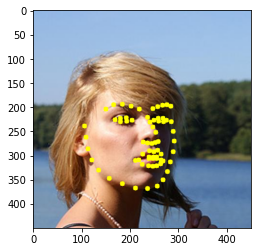

*** file: /content/AFLW2000/image03350.jpg ***
Number of faces detected: 1


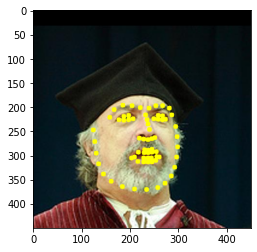

*** file: /content/AFLW2000/image00908.jpg ***
Number of faces detected: 0
*** file: /content/AFLW2000/image00801.jpg ***
Number of faces detected: 0
*** file: /content/AFLW2000/image01331.jpg ***
Number of faces detected: 1


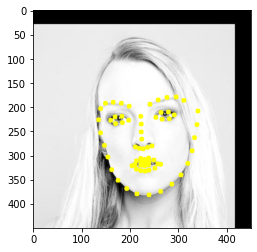

*** file: /content/AFLW2000/image03654.jpg ***
Number of faces detected: 0


In [ ]:
import sys
import dlib
import os
import urllib.request
import cv2
import matplotlib.pyplot as plt

faces_folder_path = '/content/AFLW2000'

all_mats = glob.glob(os.path.join(faces_folder_path, "*.mat"))
cnn_face_detector = dlib.get_frontal_face_detector()
sp = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')

for m in all_mats[:6]:
    f = m.replace('.mat', '.jpg')
    print("*** file: {} ***".format(f))
    img = dlib.load_rgb_image(f)
    dets = cnn_face_detector(img, 1)
    print("Number of faces detected: {}".format(len(dets)))

    if len(dets) == 0:
        continue
    for i, d in enumerate(dets):
        disp = img.copy()
        shape = sp(img, d)
        for j in range(shape.num_parts):
            cv2.circle(disp, (shape.part(j).x, shape.part(j).y), 5, (255,255, 0), -1)
        plt.figure(figsize = (4,4))
        plt.imshow(disp)
        plt.show()

(136,)


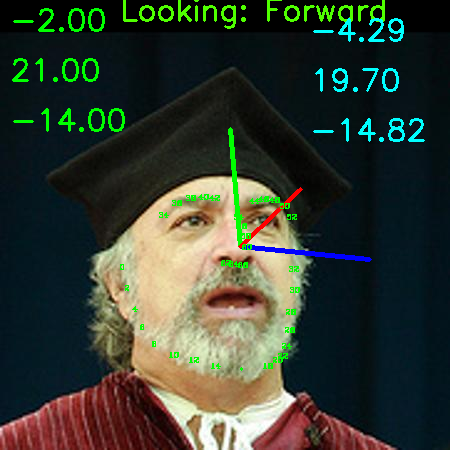

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Wed Jan 24 11:58:14 2018

@author: jerry
"""

import cv2
import math
import numpy as np
from google.colab.patches import cv2_imshow

predictor_path = '/content/shape_predictor_68_face_landmarks.dat'

faces_folder_path = '/content/AFLW2000'

detector = dlib.get_frontal_face_detector() #dlib.cnn_face_detection_model_v1('mmod_human_face_detector.dat')
predictor =  dlib.shape_predictor(predictor_path)

def get_ypr_from_mat(mat):
    # Get yaw, pitch, roll from .mat annotation.
    # They are in radians
    # [pitch yaw roll tdx tdy tdz scale_factor]
    pre_pose_params = mat['Pose_Para'][0]
    # Get [pitch, yaw, roll]
    pose = pre_pose_params[:3]
    pitch = pose[0] * 180 / np.pi
    yaw = pose[1] * 180 / np.pi
    roll = pose[2] * 180 / np.pi
    return [roll, pitch, yaw]
    
def get_shape(f):
    img = dlib.load_rgb_image(f)
    dets = detector(img, 1)
    for k, d in enumerate(dets):
        return predictor(img, d)

    # win.add_overlay(dets)
    dlib.hit_enter_to_continue()

def ref2dImagePoints(shape):
    imagePoints = [[shape.part(30).x, shape.part(30).y],
                   [shape.part(8).x, shape.part(8).y],
                   [shape.part(36).x, shape.part(36).y],
                   [shape.part(45).x, shape.part(45).y],
                   [shape.part(48).x, shape.part(48).y],
                   [shape.part(54).x, shape.part(54).y]]
    return np.array(imagePoints, dtype=np.float64)

def im_cv_show(m_name):
    im_name = m_name.replace('.mat', '.jpg')

    mat = scipy.io.loadmat(m_name)
    pt3d_68 = mat['pt3d_68'][:2, :]
    points = []
    for i in range(pt3d_68.shape[1]):
        m = pt3d_68
        points.append((m[0, i], m[1, i]))

    def face_orientation(frame, landmarks):
        size = frame.shape #(height, width, color_channel)

        image_points = np.array([
                                (landmarks[30], landmarks[31]),     # Nose tip
                                (landmarks[8], landmarks[9]),   # Chin
                                (landmarks[38], landmarks[39]),     # Left eye left corner
                                (landmarks[43], landmarks[44]),     # Right eye right corne
                                (landmarks[50], landmarks[51]),     # Left Mouth corner
                                (landmarks[60], landmarks[61])      # Right mouth corner
                            ], dtype="double")

        sp = get_shape(im_name)
        if sp != None:
            image_points = ref2dImagePoints(sp)

                            
        model_points = np.array([
                                (0.0, 0.0, 0.0),             # Nose tip
                                (0.0, -330.0, -65.0),        # Chin
                                (-165.0, 170.0, -135.0),     # Left eye left corner
                                (165.0, 170.0, -135.0),      # Right eye right corne
                                (-150.0, -150.0, -125.0),    # Left Mouth corner
                                (150.0, -150.0, -125.0)      # Right mouth corner                         
                            ])

        # Camera internals
    
        center = (size[1]/2, size[0]/2)
        focal_length = center[0] / np.tan(60/2 * np.pi / 180)
        camera_matrix = np.array(
                            [[focal_length, 0, center[0]],
                            [0, focal_length, center[1]],
                            [0, 0, 1]], dtype = "double"
                            )

        dist_coeffs = np.zeros((4,1)) # Assuming no lens distortion
        (success, rotation_vector, translation_vector) = cv2.solvePnP(model_points, image_points, camera_matrix, dist_coeffs, flags=cv2.cv2.SOLVEPNP_ITERATIVE)

        
        axis = np.float32([[500,0,0], 
                            [0,500,0], 
                            [0,0,500]])
                            
        imgpts, jac = cv2.projectPoints(axis, rotation_vector, translation_vector, camera_matrix, dist_coeffs)
        modelpts, jac2 = cv2.projectPoints(model_points, rotation_vector, translation_vector, camera_matrix, dist_coeffs)
        rvec_matrix = cv2.Rodrigues(rotation_vector)[0]

        proj_matrix = np.hstack((rvec_matrix, translation_vector))
        eulerAngles = cv2.decomposeProjectionMatrix(proj_matrix)[6] 

        
        pitch, yaw, roll = [math.radians(_) for _ in eulerAngles]


        pitch = math.degrees(math.asin(math.sin(pitch)))
        roll = -math.degrees(math.asin(math.sin(roll)))
        yaw = math.degrees(math.asin(math.sin(yaw)))
        nose = None 
        if sp is None:
            print('shape is none')
            nose = (landmarks[30], landmarks[31])
        else: 
            nose = (sp.part(30).x, sp.part(30).y)
        return imgpts, modelpts, (str(int(roll)), str(int(pitch)), str(int(yaw))), nose


    frame = cv2.imread(im_name)
    landmarks =  np.array(points).reshape(-1)
    print(landmarks.shape)

    imgpts, modelpts, rotate_degree, nose = face_orientation(frame, landmarks)

    cv2.line(frame, nose, tuple(imgpts[1].ravel()), (0,255,0), 3) #GREEN
    cv2.line(frame, nose, tuple(imgpts[0].ravel()), (255,0,), 3) #BLUE
    cv2.line(frame, nose, tuple(imgpts[2].ravel()), (0,0,255), 3) #RED

    i = 0
    remapping = [2,3,0,4,5,1]
    for index in range(0, int(len(landmarks)/2), 2):
        # cv2.circle(frame, (landmarks[index*2], landmarks[index*2+1]), 3, (255,255, 0), -1)  
        cv2.putText(frame, str('*' if index == 16 else index), (landmarks[index], landmarks[index+1]), cv2.FONT_HERSHEY_COMPLEX_SMALL, 0.4, (0, 255, 0), thickness=1, lineType=1)
        # cv2.circle(frame,  tuple(modelpts[remapping[index]].ravel().astype(int)), 2, (255,255, 0), -1)  
        
            
    #    cv2.putText(frame, rotate_degree[0]+' '+rotate_degree[1]+' '+rotate_degree[2], (10, 30),
    #                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0),
    #                thickness=2, lineType=2)
                
    for j in range(len(rotate_degree)):
                cv2.putText(frame, ('{:05.2f}').format(float(rotate_degree[j])), (10, 30 + (50 * j)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), thickness=2, lineType=2)

    gaze = "Looking: "
    if int(rotate_degree[2]) < -15:
        gaze += "Left"
    elif int(rotate_degree[2]) > 15:
        gaze += "Right"
    else:
        gaze += "Forward"
    cv2.putText(frame, gaze, (120, 20), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 80), 2)
    rotate_degree = get_ypr_from_mat(mat)
    for j in range(len(rotate_degree)):
                cv2.putText(frame, ('{:05.2f}').format(float(rotate_degree[j])), (310, 40 + (50 * j)), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), thickness=2, lineType=2)

    cv2_imshow(frame)
# im_cv_show(all_mats[0])
im_cv_show(all_mats[1])
# im_cv_show(all_mats[2])
# im_cv_show(all_mats[3])
# im_cv_show(all_mats[4])

## Reading mat files

In [135]:
faces_folder_path = '/content/drive/MyDrive/data/AFLW2000'
all_mats = glob.glob(os.path.join(faces_folder_path, "*.mat"))
mat = scipy.io.loadmat(all_mats[0])
mat

{'Color_Para': array([[0.87817276, 1.0305144 , 1.0978668 , 0.02763769, 0.03028294,
         0.06384084, 1.        ]], dtype=float32),
 'Exp_Para': array([[-0.66158534],
        [-0.33510893],
        [-0.19834051],
        [-0.46660048],
        [ 0.36629613],
        [-0.1165033 ],
        [-0.39107007],
        [-0.30449588],
        [ 0.19855216],
        [ 0.07335855],
        [-0.02232841],
        [-0.18225639],
        [-0.10478918],
        [-0.01018826],
        [ 0.13708985],
        [ 0.00398673],
        [-0.07425308],
        [-0.12902764],
        [-0.02719148],
        [-0.006835  ],
        [-0.00979515],
        [ 0.03945195],
        [ 0.02051928],
        [-0.04268559],
        [ 0.02231302],
        [ 0.00300777],
        [ 0.01452549],
        [ 0.01817106],
        [ 0.01659667]]),
 'Illum_Para': array([[ 1.08958185,  1.11761081,  1.12877846,  0.07568695,  0.13442016,
          0.17175347,  1.27417314,  0.75853723,  0.        , 20.        ]]),
 'Pose_Para': array(

In [128]:
def get_landmarks_from_mat(mat):
    pt3d_68 = np.array(mat['pt3d_68'])
    arr = pt3d_68[:-1, :].reshape(-1)
    x = arr[60] - arr[16]
    y = arr[61] - arr[17]
    for i in range(0, int(len(arr)/2), 2):
        arr[i] -= arr[60]
        arr[i+1] -= arr[61]
        
        arr[i] /= x
        arr[i+1] /= y
    return arr


In [129]:
def get_ypr_from_mat(mat):
    # Get yaw, pitch, roll from .mat annotation.
    # They are in radians
    # [pitch yaw roll tdx tdy tdz scale_factor]
    pre_pose_params = mat['Pose_Para'][0]
    # Get [pitch, yaw, roll]
    pose = pre_pose_params[:3]
    pitch = ((pose[0] * 180) / np.pi)
    yaw = ((pose[1] * 180) / np.pi)
    roll = ((pose[2] * 180) / np.pi)
    return [yaw, pitch, roll]

In [136]:
faces_folder_path = '/content/drive/MyDrive/data/AFLW2000'
x_data = []
y_data = []
all_mats = glob.glob(os.path.join(faces_folder_path, "*.mat"))
for mat_name in all_mats:
    mat = scipy.io.loadmat(mat_name)
    x_data.append(get_landmarks_from_mat(mat))
    y_data.append(get_ypr_from_mat(mat))

In [164]:
X = pd.DataFrame(data = x_data)
y = pd.DataFrame(data = y_data, columns=['roll', 'pitch', 'yaw'])

In [132]:
X = pd.read_csv('/content/drive/MyDrive/data/points.csv', index_col=0)
y = pd.read_csv('/content/drive/MyDrive/data/angels.csv', index_col=0)

In [133]:
# isna = X.isna().sum()
# cols_to_delete = isna[isna>0].index.values
# X = X.drop(cols_to_delete, axis=1)

## Model training

###Basline model

In [165]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)
X_train = X_train.values

print("train", X_train.shape, y_train.shape)
print("val", X_val.shape, y_val.shape)
print("test", X_test.shape, y_test.shape)

model = MLPRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)

r2_score(y_pred, y_val, multioutput='raw_values')

train (1600, 136) (1600, 3)
val (200, 136) (200, 3)
test (200, 136) (200, 3)


array([-0.15565418,  0.18892768, -0.07881997])

###Pipelines

In [16]:
def getScores(estimator, x, y):
    yPred = estimator.predict(x)
    return (r2_score(y, yPred), mean_squared_error(y, yPred))

def my_scorer(estimator, x, y):
    r2, mse = getScores(estimator, x, y)
    print(r2, mse)
    return (r2 + round(mse))

In [166]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)

X_train = X_train.values

yaw_train = y_train['yaw']
yaw_val = y_val['yaw']
yaw_test = y_test['yaw']

yaw_pipe = make_pipeline(
    # StandardScaler(),
    # RobustScaler(),
    PCA(n_components=0.99),
    # MLPRegressor(),
    # MLPRegressor(early_stopping=True,  hidden_layer_sizes=(200,))
    # RandomForestRegressor(n_estimators=100, max_depth=5),
    # KNeighborsRegressor(n_neighbors=6),
    # LinearRegression()
    # Ridge()
    # DecisionTreeRegressor(max_depth=6)
    XGBRegressor(max_depth=4, learning_rate=0.1, n_estimators=150)

)

scores = cross_val_score(yaw_pipe, X_train, yaw_train, scoring='r2', cv=5, n_jobs=-1)
print(scores, np.mean(scores))

yaw_pipe.fit(X_train, yaw_train)

train_pred = yaw_pipe.predict(X_train)
val_pred = yaw_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, yaw_train))
print("validation mse: ", mean_squared_error(val_pred, yaw_val))
print()
print("train r2: ", r2_score(train_pred, yaw_train))
print("validation r2: ", r2_score(val_pred, yaw_val))
print()
print("train score: ", yaw_pipe.score(X_train, yaw_train))
print("validation score: ", yaw_pipe.score(X_val, yaw_val))

[0.46127264 0.22438447 0.12870711 0.14069304 0.45174817] 0.28136108737063475
[08:27:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
train mse:  68.94821009838901
validation mse:  249.85122074295708

train r2:  0.9594567430813493
validation r2:  0.170516979144414

train score:  0.9641324633386302
validation score:  0.513867040367645


In [167]:
print("test score: ", yaw_pipe.score(X_test, yaw_test))

test score:  -0.015070799585966688


In [168]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)

X_train = X_train.values

pitch_train = y_train['pitch']
pitch_val = y_val['pitch']
pitch_test = y_test['pitch']

r1 = DecisionTreeRegressor()
r2 = RandomForestRegressor(n_estimators=30, n_jobs=-1)
r3 = KNeighborsRegressor(n_neighbors=3)
r4 = XGBRegressor(n_estimators=30, n_jobs=-1)
r5 = GradientBoostingRegressor(n_estimators=20)

er = VotingRegressor(
    [
        ('dt', r1), 
        ('rf', r2), 
        # ('knn', r3), 
        # ('xgb', r4),
        ('gb', r5)
    ],
        weights=[3, 3, 1],
    )

pitch_pipe = make_pipeline(
    # PolynomialFeatures(2),
    # PowerTransformer(),
    RobustScaler(),
    PCA(n_components=0.99),
    # RandomForestRegressor(n_estimators=200),
    # er,
    # LinearRegression()
    MLPRegressor(),
    # DecisionTreeRegressor(),
)

scores = cross_val_score(pitch_pipe, X_train, yaw_train, scoring='r2', cv=5, n_jobs=-1)
print(scores, np.mean(scores))


pitch_pipe.fit(X_train, pitch_train)


train_pred = pitch_pipe.predict(X_train)
val_pred = pitch_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, pitch_train))
print("validation mse: ", mean_squared_error(val_pred, pitch_val))
print('')
print("train r2: ", r2_score(train_pred, pitch_train))
print("validation r2: ", r2_score(val_pred, pitch_val))
print('')
print("train score: ", pitch_pipe.score(X_train, pitch_train))
print("validation score: ", pitch_pipe.score(X_val, pitch_val))

[ 0.26176103 -1.79872378  0.1040378   0.02656081  0.12349621] -0.2565735863786488
train mse:  1325.577337426536
validation mse:  367.9206181324779

train r2:  -18.464326621124965
validation r2:  -8.773072221014207

train score:  0.10777194436073712
validation score:  0.07691564621365887


In [169]:
print("test score: ", pitch_pipe.score(X_test, pitch_test))

test score:  0.012526103839441638


In [110]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)

X_train = X_train.values

roll_train = y_train['roll']
roll_val = y_val['roll']
roll_test = y_test['roll']

r1 = DecisionTreeRegressor(max_depth=5)
r2 = RandomForestRegressor(n_estimators=50, n_jobs=-1)
r3 = KNeighborsRegressor(n_neighbors=3)
r4 = XGBRegressor(n_estimators=50, n_jobs=-1)
r5 = GradientBoostingRegressor(n_estimators=20)

er = VotingRegressor(
    [
        # ('dt', r1), 
        ('rf', r2), 
        ('knn', r3), 
        ('xgb', r4),
        # ('gb', r5)
    ],
        # weights=[3, 3, 1],
    )

roll_pipe = make_pipeline(
    # PolynomialFeatures(2),
    # PowerTransformer(),
    RobustScaler(),
    # MinMaxScaler(),
    PCA(n_components=0.99),
    # r1 # 15
    # r2 # 57
    # r3 # 43
    # r4 # 51
    # r5 # 45
    # AdaBoostRegressor(LinearRegression())
    # MLPRegressor(hidden_layer_sizes=(150,), activation='relu', solver='adam', alpha=0.0001, random_state=1)
    MLPRegressor(early_stopping=True),
    # RandomForestRegressor(n_estimators=150),
    # LinearRegression()
    # er,
    # DecisionTreeRegressor(),
)

roll_pipe.fit(X_train, roll_train)


train_pred = roll_pipe.predict(X_train)
val_pred = roll_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, roll_train))
print("validation mse: ", mean_squared_error(val_pred, roll_val))
print('')
print("train r2: ", r2_score(train_pred, roll_train))
print("validation r2: ", r2_score(val_pred, roll_val))
print('')
print("train score: ", roll_pipe.score(X_train, roll_train))
print("validation score: ", roll_pipe.score(X_val, roll_val))

train mse:  5.763139817800347
validation mse:  10.347322821375341

train r2:  0.927014452474388
validation r2:  0.8712352291403627

train score:  0.9327534458092867
validation score:  0.8806493279022576


In [111]:
tuned_parameters = [{
    'mlpregressor__hidden_layer_sizes': [(100,), (150,), (200,)],
    # 'mlpregressor__activation': ['identity', 'logistic', 'tanh', 'relu'],
    'mlpregressor__solver': ['adam', 'sgd', 'lbfgs'],
    'mlpregressor__alpha': [0.0001 , 0.001, 0.01],
    # 'mlpregressor__learning_rate': ['constant', 'invscaling', 'adaptive'],
}]

pipe_cv = GridSearchCV(roll_pipe, tuned_parameters, scoring='r2', n_jobs=-1, cv=5)
pipe_cv.fit(X_train, roll_train)
print(pipe_cv.best_params_)
model = pipe_cv.best_estimator_


{'mlpregressor__alpha': 0.01, 'mlpregressor__hidden_layer_sizes': (150,), 'mlpregressor__solver': 'adam'}


In [112]:
# {'mlpregressor__activation': 'relu', 'mlpregressor__alpha': 0.001, 'mlpregressor__hidden_layer_sizes': (200,), 'mlpregressor__learning_rate': 'constant', 'mlpregressor__solver': 'adam'}

roll_pipe = model


# roll_pipe.fit(X_train, roll_train)

train_pred = roll_pipe.predict(X_train)
val_pred = roll_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, roll_train))
print("validation mse: ", mean_squared_error(val_pred, roll_val))
print('')
print("train r2: ", r2_score(train_pred, roll_train))
print("validation r2: ", r2_score(val_pred, roll_val))
print('')
print("train score: ", roll_pipe.score(X_train, roll_train))
print("validation score: ", roll_pipe.score(X_val, roll_val))

train mse:  5.738261027999965
validation mse:  9.314296800292153

train r2:  0.927521862876582
validation r2:  0.8833947255153777

train score:  0.9330437411932965
validation score:  0.8925647143301402


In [113]:
print("test score: ", roll_pipe.score(X_test, roll_test))

test score:  0.8599923462568888


In [16]:
# rf = make_pipeline(
#     RobustScaler(),                                         #MinMaxScaler
#     PCA(n_components=0.99),
#     # MultiOutputRegressor(XGBRegressor(max_depth=2, n_estimators=200, n_jobs=-1)),          #[ 0.98907254  0.63086736 -0.83218354]
#     # MultiOutputRegressor(GradientBoostingRegressor())     #[ 0.98387731  0.69022103 -0.78279849]
#      RandomForestRegressor(n_estimators=250, n_jobs=-1, random_state=0),     #[ 0.98873583  0.74786508 -0.60184838]
#     # MultiOutputRegressor(AdaBoostRegressor(
#     #     base_estimator=DecisionTreeRegressor(max_depth=4),
#     #     n_estimators=150, 
#     #     learning_rate=2,
#     # ))
#     # DecisionTreeRegressor(max_depth=4)                               #[ 0.95459386  0.66560973 -0.08578649]
#     # LinearRegression()                                    #[ 0.94331537  0.17982066 -0.38096524]
#     # MultiOutputRegressor(SVR())                           #[ 0.90448932 -0.79865203 -1.37388933]
#     # MultiOutputRegressor(Ridge())                         #[ 0.94383379  0.16949831 -0.39814276]
#     )
# rf.fit(X_train, y_train)
# mse = mean_squared_error(y_val, rf.predict(X_val))
# print("The mean squared error (MSE) on test set: {:.4f}".format(mse))
# 
# # cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)# evaluate the model and collect the scores
# # n_scores = cross_val_score(rf, X_train, y_train, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# # n_scores = np.absolute(n_scores)
# 
# # print('MAE: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))
# print (mean_squared_error(rf.predict(X_train), y_train, multioutput='raw_values'))
# print (mean_squared_error(rf.predict(X_val), y_val, multioutput='raw_values'))
# train = ((rf.predict(X_train) - y_train)**2).mean()
# val = ((rf.predict(X_val) - y_val)**2).mean()
# display(train)
# display(val)
# abs(train - val)
# print(rf.score(X_train, y_train))
# print(rf.score(X_val, y_val))

# Using MediaPipe

In [4]:
!pip install -q mediapipe

     |████████████████████████████████| 32.8 MB 261 kB/s 


In [5]:
import mediapipe as mp
import csv

In [31]:
mp_drawing = mp.solutions.drawing_utils # Drawing helpers
mp_holistic = mp.solutions.holistic # Mediapipe Solutions
mp_drawing_styles = mp.solutions.drawing_styles

faces_folder_path = '/content/drive/MyDrive/data/AFLW2000'
paths = glob.glob(os.path.join(faces_folder_path, "*.jpg"))
paths_mat = glob.glob(os.path.join(faces_folder_path, "*.mat"))

In [197]:
def get_ypr_from_mat(mat):
    # Get yaw, pitch, roll from .mat annotation.
    # They are in radians
    # [pitch yaw roll tdx tdy tdz scale_factor]
    pre_pose_params = mat['Pose_Para'][0]
    # Get [pitch, yaw, roll]
    pose = pre_pose_params[:3]
    pitch = pose[0]
    yaw = pose[1]
    roll = pose[2]
    return [roll, pitch, yaw]

In [207]:
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:

    for idx, file in enumerate(paths):
        count = 0
        image = cv2.imread(file)
        image_height, image_width, _ = image.shape
        # Convert the BGR image to RGB before processing.
        results = holistic.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

        try:
           
            face = results.face_landmarks.landmark
            NoseX = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].x * image_width
            NoseY = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].y * image_height
            LfeoX = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.LEFT_EYE_OUTER].x * image_width
            LfeoY = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.LEFT_EYE_OUTER].y * image_height
            
            distX = NoseX - LfeoX
            distY = NoseY - LfeoY
            dist = (distX**2 + distY**2)**0.5

            Xs = []
            Ys = []
            for landmark in face:
                x = ((landmark.x * image_width) - NoseX)/dist
                y = ((landmark.y * image_height) - NoseY)/dist
                Xs.append(x)
                Ys.append(y)
            
            face_row = Xs + Ys
            
            mat_file = scipy.io.loadmat(paths_mat[idx])
            angles = get_ypr_from_mat(mat_file) # roll, pitch, yaw
            face_row = face_row + angles
            
            with open('landmarks_data.csv', mode='a', newline='') as f:
                csv_writer = csv.writer(f, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
                csv_writer.writerow(face_row) 
                
        except:
            pass
        

In [ ]:
data = pd.read_csv('landmarks_data.csv', header=None)
data.to_csv('/content/drive/MyDrive/data/mp_points.csv', index=False)

In [10]:
data = pd.read_csv('/content/drive/MyDrive/data/mp_points.csv')

In [12]:
X = data.iloc[:, :-3]
y = data.iloc[:, -3:]
y.columns = ['roll', 'pitch', 'yaw']
print(data.shape, X.shape, y.shape)

(1832, 939) (1832, 936) (1832, 3)


## Model training

###Basline model

In [13]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)
X_train = X_train.values

print("train", X_train.shape, y_train.shape)
print("val", X_val.shape, y_val.shape)
print("test", X_test.shape, y_test.shape)

model = MLPRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)

r2_score(y_pred, y_val, multioutput='raw_values')

train (1465, 936) (1465, 3)
val (184, 936) (184, 3)
test (183, 936) (183, 3)


array([-0.14766792, -0.0890636 ,  0.46749173])

### Pipelines

#### YAW

In [214]:
def getScores(estimator, x, y):
    yPred = estimator.predict(x)
    return (r2_score(y, yPred), mean_squared_error(y, yPred))

def my_scorer(estimator, x, y):
    r2, mse = getScores(estimator, x, y)
    print(r2, mse)
    return (r2 + round(mse))

In [14]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)

X_train = X_train.values

yaw_train = y_train['yaw']
yaw_val = y_val['yaw']
yaw_test = y_test['yaw']

yaw_pipe = make_pipeline(
    # StandardScaler(),
    RobustScaler(),
    PCA(n_components=0.99),
    # MLPRegressor(),
    # MLPRegressor(early_stopping=True,  hidden_layer_sizes=(200,))
    # RandomForestRegressor(n_estimators=100, max_depth=5),
    # RandomForestRegressor()
    # KNeighborsRegressor(n_neighbors=6),
    # LinearRegression()
    Ridge()
    # DecisionTreeRegressor(max_depth=6)
    # XGBRegressor(max_depth=4, learning_rate=0.1, n_estimators=150)

)

scores = cross_val_score(yaw_pipe, X_train, yaw_train, scoring='r2', cv=5, n_jobs=-1)
print(scores, np.mean(scores))

yaw_pipe.fit(X_train, yaw_train)

train_pred = yaw_pipe.predict(X_train)
val_pred = yaw_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, yaw_train))
print("validation mse: ", mean_squared_error(val_pred, yaw_val))
print()
print("train r2: ", r2_score(train_pred, yaw_train))
print("validation r2: ", r2_score(val_pred, yaw_val))
print()
print("train score: ", yaw_pipe.score(X_train, yaw_train))
print("validation score: ", yaw_pipe.score(X_val, yaw_val))

[0.8413949  0.59679758 0.87101262 0.88108075 0.90042707] 0.8181425821947184
train mse:  0.06328308577341843
validation mse:  0.07735035739346074

train r2:  0.7674084186764127
validation r2:  0.7614437531321883

train score:  0.8113017001659121
validation score:  0.7882911948583309


In [15]:
print("test score: ", yaw_pipe.score(X_test, yaw_test))

test score:  0.7072378871726983


#### PITCH

In [16]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=0)

X_train = X_train.values

pitch_train = y_train['pitch']
pitch_val = y_val['pitch']
pitch_test = y_test['pitch']

r1 = DecisionTreeRegressor()
r2 = RandomForestRegressor(n_estimators=30, n_jobs=-1)
r3 = KNeighborsRegressor(n_neighbors=3)
r4 = XGBRegressor(n_estimators=30, n_jobs=-1)
r5 = GradientBoostingRegressor(n_estimators=20)

er = VotingRegressor(
    [
        ('dt', r1), 
        ('rf', r2), 
        # ('knn', r3), 
        # ('xgb', r4),
        ('gb', r5)
    ],
        weights=[3, 3, 1],
    )

pitch_pipe = make_pipeline(
    # PolynomialFeatures(2),
    # PowerTransformer(),
    # RobustScaler(),
    PCA(n_components=0.99),
    # RandomForestRegressor(n_estimators=200),
    # XGBRegressor()
    KNeighborsRegressor()
    # er,
    # LinearRegression()
    # MLPRegressor(early_stopping=True,  hidden_layer_sizes=(200,))
    # DecisionTreeRegressor(),
)

scores = cross_val_score(pitch_pipe, X_train, yaw_train, scoring='r2', cv=5, n_jobs=-1)
print(scores, np.mean(scores))


pitch_pipe.fit(X_train, pitch_train)


train_pred = pitch_pipe.predict(X_train)
val_pred = pitch_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, pitch_train))
print("validation mse: ", mean_squared_error(val_pred, pitch_val))
print('')
print("train r2: ", r2_score(train_pred, pitch_train))
print("validation r2: ", r2_score(val_pred, pitch_val))
print('')
print("train score: ", pitch_pipe.score(X_train, pitch_train))
print("validation score: ", pitch_pipe.score(X_val, pitch_val))

[0.86933481 0.58921155 0.8955618  0.893839   0.91820976] 0.8332313843927069
train mse:  0.09994772329358362
validation mse:  0.07644730098951641

train r2:  -1.2952473574273657
validation r2:  -1.9971385903513692

train score:  0.4644609446257951
validation score:  0.3284537780463681


In [229]:
print("test score: ", pitch_pipe.score(X_test, pitch_test))

test score:  -0.06674198864403502


#### ROLL

In [23]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=2)
X_test, X_val, y_test, y_val = train_test_split(X_val.values, y_val, test_size=0.50, shuffle=True, random_state=2)

X_train = X_train.values

roll_train = y_train['roll']
roll_val = y_val['roll']
roll_test = y_test['roll']

r1 = DecisionTreeRegressor(max_depth=5)
r2 = RandomForestRegressor(n_estimators=50, n_jobs=-1)
r3 = KNeighborsRegressor(n_neighbors=3)
r4 = XGBRegressor(n_estimators=50, n_jobs=-1)
r5 = GradientBoostingRegressor(n_estimators=20)

er = VotingRegressor(
    [
        # ('dt', r1), 
        ('rf', r2), 
        ('knn', r3), 
        ('xgb', r4),
        # ('gb', r5)
    ],
        # weights=[3, 3, 1],
    )

roll_pipe = make_pipeline(
    # PolynomialFeatures(2),
    # PowerTransformer(),
    # RobustScaler(),
    # MinMaxScaler(),
    # PCA(n_components=0.99),
    # r1 # 15
    r2 # 57
    # r3 # 43
    # r4 # 51
    # r5 # 45
    # AdaBoostRegressor(LinearRegression())
    # MLPRegressor(hidden_layer_sizes=(150,), activation='relu', solver='adam', alpha=0.08, random_state=1)
    # MLPRegressor(early_stopping=True),
    # RandomForestRegressor(n_estimators=150),
    # LinearRegression()
    # er,
    # DecisionTreeRegressor(),
)

scores = cross_val_score(roll_pipe, X_train, yaw_train, scoring='r2', cv=5, n_jobs=-1)
print(scores, np.mean(scores))

roll_pipe.fit(X_train, roll_train)


train_pred = roll_pipe.predict(X_train)
val_pred = roll_pipe.predict(X_val)

print("train mse: ", mean_squared_error(train_pred, roll_train))
print("validation mse: ", mean_squared_error(val_pred, roll_val))
print('')
print("train r2: ", r2_score(train_pred, roll_train))
print("validation r2: ", r2_score(val_pred, roll_val))
print('')
print("train score: ", roll_pipe.score(X_train, roll_train))
print("validation score: ", roll_pipe.score(X_val, roll_val))

[0.88317588 0.65811146 0.89973737 0.9358151  0.94619829] 0.8646076217810087
train mse:  0.04001009984205792
validation mse:  0.7692898560594597

train r2:  0.7491542329826602
validation r2:  -0.3308838853755742

train score:  0.8665998953145069
validation score:  -2.1163019969407597


In [24]:
print("test score: ", roll_pipe.score(X_test, roll_test))

test score:  0.15752299609104592


## Video procesing

### Test on Youtube video

In [ ]:
!pip install -q pytube

In [ ]:
!rm *.mp4

In [ ]:
from pytube import YouTube
import os

yt = YouTube('https://youtu.be/BkLzo_oNVho')
yt = yt.streams.filter(progressive=True, file_extension='mp4').order_by('resolution').desc().first()
yt.download()
!mv '/content/The Truth about Being the Stupidest in the Room  Simon Sinek.mp4' /content/inter.mp4
!ffmpeg -i inter.mp4 -ss 00:00:00 -to 00:00:40 -c:v libx264 -preset slow -crf 22 -c:a copy output.mkv

### TEST ON YOURSELF


In [61]:
def record_video(filename):
  js=Javascript("""
    async function recordVideo() {
      const options = { mimeType: "video/webm; codecs=vp9" };
      const div = document.createElement('div');
      const capture = document.createElement('button');
      const stopCapture = document.createElement("button");
      
      capture.textContent = "Start Recording";
      capture.style.background = "orange";
      capture.style.color = "white";

      stopCapture.textContent = "Stop Recording";
      stopCapture.style.background = "red";
      stopCapture.style.color = "white";
      div.appendChild(capture);

      const video = document.createElement('video');
      const recordingVid = document.createElement("video");
      video.style.display = 'block';

      const stream = await navigator.mediaDevices.getUserMedia({audio:true, video: true});
    
      let recorder = new MediaRecorder(stream, options);
      document.body.appendChild(div);
      div.appendChild(video);

      video.srcObject = stream;
      video.muted = true;

      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => {
        capture.onclick = resolve;
      });
      recorder.start();
      capture.replaceWith(stopCapture);

      await new Promise((resolve) => stopCapture.onclick = resolve);
      recorder.stop();
      let recData = await new Promise((resolve) => recorder.ondataavailable = resolve);
      let arrBuff = await recData.data.arrayBuffer();
      
      // stop the stream and remove the video element
      stream.getVideoTracks()[0].stop();
      div.remove();

      let binaryString = "";
      let bytes = new Uint8Array(arrBuff);
      bytes.forEach((byte) => {
        binaryString += String.fromCharCode(byte);
      })
    return btoa(binaryString);
    }
  """)
  try:
    display(js)
    data=eval_js('recordVideo({})')
    binary=b64decode(data)
    with open(filename,"wb") as video_file:
      video_file.write(binary)
    print(f"Finished recording video at:{filename}")
  except Exception as err:
    print(str(err))
video_path = 'twister'
record_video(video_path)

<IPython.core.display.Javascript object>

Finished recording video at:twister


In [62]:
def show_video(video_path, video_width = 600):
  
  video_file = open(video_path, "r+b").read()

  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

show_video(video_path)

In [ ]:
# !ffmpeg -i twister -c:v libxvid output.mp4
!ffmpeg -i twister -c:v libx264 -preset slow -crf 22 -c:a copy output.mkv

### Video Processing start

In [76]:
Video_FILE = 'output.mkv'

In [77]:
video=cv2.VideoCapture(Video_FILE)
count=int(video.get(cv2.CAP_PROP_FRAME_COUNT))
video.release()
print('Total no of frames: ', count)

Total no of frames:  260


In [78]:
def get_frames(filename):
    video=cv2.VideoCapture(filename)
    while video.isOpened():
        rete,frame=video.read()
        if rete:
            yield frame
        else:
            video.release()
            yield None
            break
    # video.release()

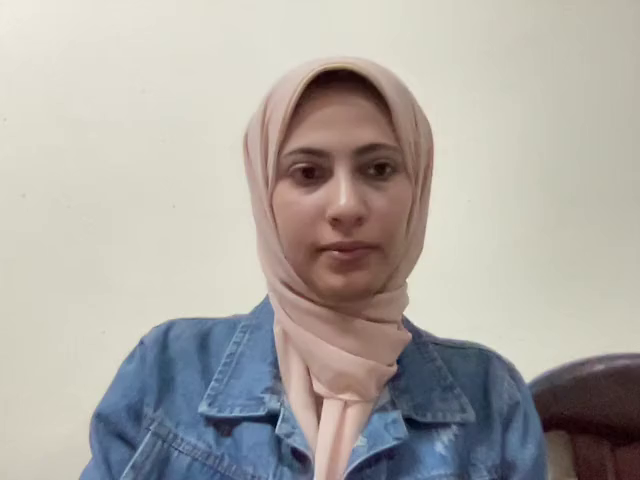

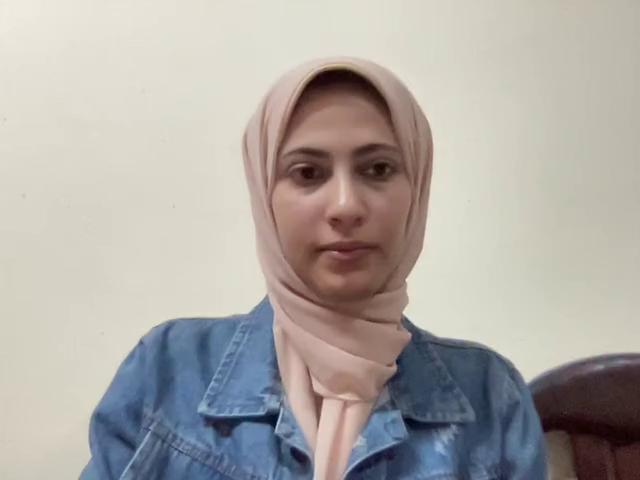

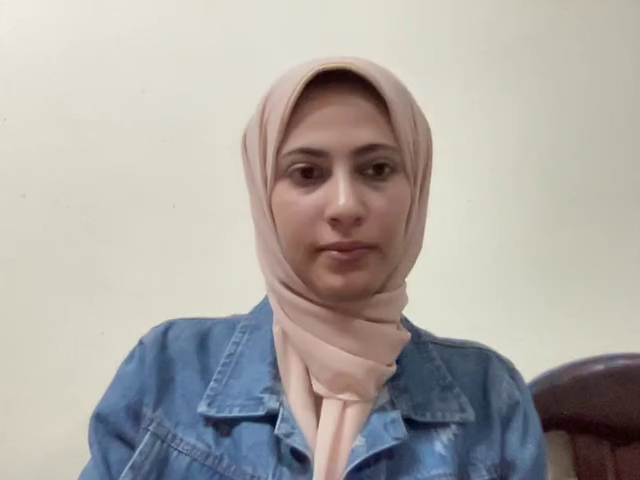

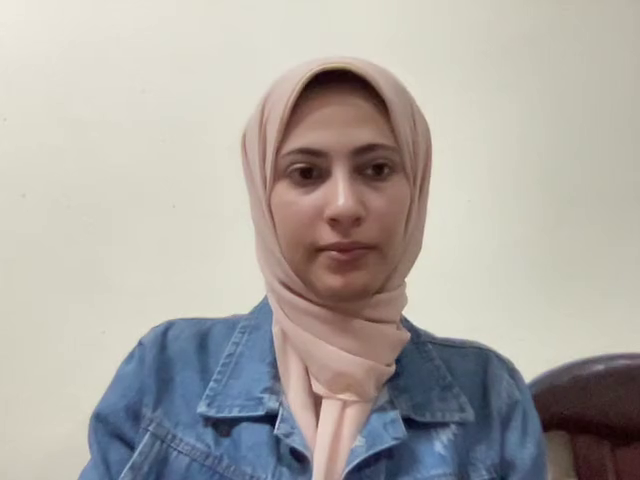

In [80]:
i = 0
for f in get_frames(Video_FILE):
    if f is None:
        break
    # img = cv2.imread('logo.png', cv2.IMREAD_UNCHANGED)
    cv2_imshow(f)
    i += 1
    if i > 3:
        break
    # cv2.imshow('frame',f)
    if cv2.waitKey(10) == 40:
        break

In [81]:
def get_frame(filename,index):
    counter=0
    video=cv2.VideoCapture(filename)
    if video.isOpened():
        print("Video opened successfully")
        while video.isOpened():
            rete, frame = video.read()
            # print(counter)
            if rete:
                if counter==index:
                    return frame
                counter +=1
            else:
                break
        video.release()
    else:
        raise Exception("Could not open video")
    return None

In [82]:
frame = get_frame(Video_FILE,15)
print('shape is', frame.shape)
print('pixel at (60,21)',frame[60,21,:])
print('pixel at (120,10)',frame[120,10,:])

Video opened successfully
shape is (480, 640, 3)
pixel at (60,21) [217 227 231]
pixel at (120,10) [209 222 225]


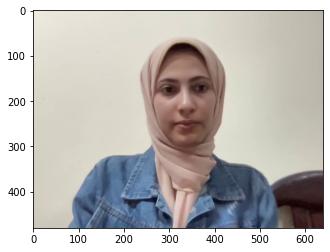

In [83]:
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

pixel at (120,10) [225 222 209]


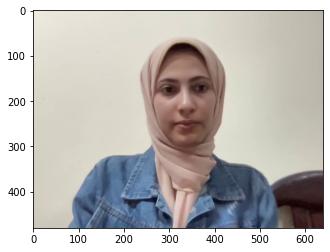

In [84]:
fix_frame=cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
print('pixel at (120,10)',fix_frame[120,10,:])
plt.imshow(fix_frame)

Video opened successfully


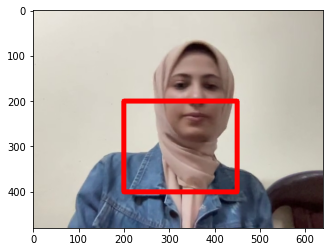

In [85]:
frame=get_frame(Video_FILE,100)
cv2.rectangle(frame,(200,400),(450,200),color=(0,0,255),thickness=10)
fixed_frame=cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
plt.imshow(fixed_frame)

In [86]:
fourcc=cv2.VideoWriter_fourcc(*'MP4V')
OUT_VID = 'new_vid.mp4'
cap = cv2.VideoCapture(Video_FILE)
video_out = cv2.VideoWriter(OUT_VID,fourcc, 20.0,(int(cap.get(3)),int(cap.get(4))))
print((int(cap.get(3)),int(cap.get(4))))
cap.release()

counter = 0
for frame in get_frames(Video_FILE):
    if frame is None:
        print('breaking')
        break
    cv2.putText(frame,text=str(counter), org=(100,100),
               fontFace=cv2.FONT_HERSHEY_SIMPLEX,
               fontScale=3,
               color=(0,255,0),
               thickness=10)
    
    video_out.write(frame)
    counter +=1
video_out.release()
counter

(640, 480)
breaking


260

In [87]:
clip=VideoFileClip(OUT_VID)
clip.ipython_display()

100%|█████████▉| 260/261 [00:01<00:00, 196.88it/s]


In [89]:
fourcc=cv2.VideoWriter_fourcc(*'MP4V')
OUT_VID = 'new_vid_2.mp4'
cap = cv2.VideoCapture(Video_FILE)
video_out = cv2.VideoWriter(OUT_VID,fourcc, 20.0,(int(cap.get(3)),int(cap.get(4))))
print((int(cap.get(3)),int(cap.get(4))))
cap.release()

with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    for frame in get_frames(Video_FILE):
        if frame is None:
            print('breaking')
            break

        # Recolor Feed
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image.flags.writeable = False        
        
        # Make Detections
        results = holistic.process(image)
        # print(results.face_landmarks)
        
        # face_landmarks, pose_landmarks, left_hand_landmarks, right_hand_landmarks
        
        # Recolor image back to BGR for rendering
        image.flags.writeable = True   
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        image_height, image_width, _ = image.shape

        # 1. Draw face landmarks
        mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION, 
                                 mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1),
                                 mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
                                 )
        video_out.write(image)


video_out.release()

(640, 480)
breaking


In [90]:
clip=VideoFileClip(OUT_VID)
clip.ipython_display()

100%|█████████▉| 260/261 [00:01<00:00, 179.78it/s]


In [91]:
def draw_axis(img, yaw, pitch, roll, tdx=None, tdy=None, size = 100):

    pitch = pitch * np.pi / 180
    yaw = -(yaw * np.pi / 180)
    roll = roll * np.pi / 180

    if tdx != None and tdy != None:
        tdx = tdx
        tdy = tdy
    else:
        height, width = img.shape[:2]
        tdx = width / 2
        tdy = height / 2

    # X-Axis pointing to right. drawn in red
    x1 = size * (cos(yaw) * cos(roll)) + tdx
    y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

    # Y-Axis | drawn in green
    #        v
    x2 = size * (-cos(yaw) * sin(roll)) + tdx
    y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

    # Z-Axis (out of the screen) drawn in blue
    x3 = size * (sin(yaw)) + tdx
    y3 = size * (-cos(yaw) * sin(pitch)) + tdy

    cv2.line(img, (int(tdx), int(tdy)), (int(x1),int(y1)),(0,0,255),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x2),int(y2)),(0,255,0),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x3),int(y3)),(255,0,0),2)

    return img

In [97]:
fourcc=cv2.VideoWriter_fourcc(*'DIVX')
OUT_VID = 'new_vid2.avi'
cap = cv2.VideoCapture(Video_FILE)
video_out = cv2.VideoWriter(OUT_VID,fourcc, 20.0,(int(cap.get(3)),int(cap.get(4))))
print((int(cap.get(3)),int(cap.get(4))))
cap.release()

with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    for frame in get_frames(Video_FILE):
        if frame is None:
            print('breaking')
            break

        # Recolor Feed
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image.flags.writeable = False        
        
        # Make Detections
        results = holistic.process(image)
        # print(results.face_landmarks)
        
        # face_landmarks, pose_landmarks, left_hand_landmarks, right_hand_landmarks
        
        # Recolor image back to BGR for rendering
        image.flags.writeable = True   
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        image_height, image_width, _ = image.shape

        # 1. Draw face landmarks
        # mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION, 
        #                          mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1),
        #                          mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
        #                          )
        # try:
        face = results.face_landmarks.landmark
        NoseX = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].x * image_width
        NoseY = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].y * image_height
        LfeoX = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.LEFT_EYE_OUTER].x * image_width
        LfeoY = results.pose_landmarks.landmark[mp_holistic.PoseLandmark.LEFT_EYE_OUTER].y * image_height

        distX = NoseX - LfeoX
        distY = NoseY - LfeoY
        dist = (distX**2 + distY**2)**0.5

        Xs = []
        Ys = []
        for landmark in face:
            x = ((landmark.x * image_width) - NoseX)/dist
            y = ((landmark.y * image_height) - NoseY)/dist
            Xs.append(x)
            Ys.append(y)
        
        face_row = np.array(Xs + Ys).reshape(1, -1)
        
        pitch = pitch_pipe.predict(face_row)
        yaw = yaw_pipe.predict(face_row)
        roll = roll_pipe.predict(face_row)


        yaw = -yaw
        tdx = NoseX
        tdy = NoseY
        size = 100

        # print('here')
        # X-Axis pointing to right. drawn in red
        x1 = size * (cos(yaw) * cos(roll)) + tdx
        y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

        # Y-Axis | drawn in green
        #        v
        x2 = size * (-cos(yaw) * sin(roll)) + tdx
        y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

        # Z-Axis (out of the screen) drawn in blue
        x3 = size * (sin(yaw)) + tdx
        y3 = size * (-cos(yaw) * sin(pitch)) + tdy
        
        # print((int(tdx), int(tdy)), (int(x1), int(y1)))
        # print((int(tdx), int(tdy)), (int(x2), int(y2)))
        # print((int(tdx), int(tdy)), (int(x3), int(y3)))

        cv2.line(image, (int(tdx), int(tdy)), (int(x1), int(y1)),(0,0,255),3)
        cv2.line(image, (int(tdx), int(tdy)), (int(x2), int(y2)),(0,255,0),3)
        cv2.line(image, (int(tdx), int(tdy)), (int(x3), int(y3)),(255,0,0),2)

        # except:
        #     pass
        video_out.write(image)


video_out.release()

(640, 480)
breaking


In [98]:
clip = VideoFileClip(OUT_VID)
clip.ipython_display()

100%|█████████▉| 260/261 [00:01<00:00, 189.78it/s]
